This notebook illustrates the workflow this repo provides

We will do key imports up here. Modules from `src` that are pivotal to stages throughout the WF will be imported in their respective sections.

In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os

import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

from importlib import reload
import warnings
warnings.filterwarnings('ignore')

import sys
from pathlib import Path

# get to src
src_path = Path(".", "src")
if str(src_path) not in sys.path:
    sys.path.append(str(src_path))

Here we declare some key parameters that will dictate the rest of the workflow. 

In [7]:
num_classes = 3
# the following is specific to a 3 class model. it will be different for 5
down_margin = 0.0038
up_margin = 0.0068

lag_factor = 5
test_size = 0.20

data = "BTCUSDT_30m_2020.csv"

from session_info import SessionInfo

session = SessionInfo(
    data, num_classes, lag_factor, test_size,
    up_margin=up_margin, down_margin=down_margin
)

Load data in and do any required cleaning

In [8]:
df = pd.read_csv("./input/" + data)
df.drop(df.columns[df.columns.str.contains('unnamed', case=False)], axis=1, inplace=True)

# drop rows where volume == 0
df = df.loc[df['volume'] != 0]

print(df.columns)
print(df.shape)

Index(['timestamp', 'open', 'high', 'low', 'close', 'volume',
       'base_asset_volume', 'no_trades', 'taker_buy_vol',
       'taker_buy_base_asset_vol'],
      dtype='object')
(89869, 10)


**Feature Engineering and Preprocessing**
***

Add the target variable and do any feature engineering.

In [9]:
import add_features as af
import feature_engineering as fe
reload(af)
reload(fe)

df = af.add_features_exp(df, session)

# move the jump and target variable (jump_tmr) to the end
df = df[[col for col in df.columns if col not in ['next_jump']] + ['next_jump']]

# log what features we are using
features = [col for col in df.columns if col not in ['timestamp', 'next_jump']]
session.add_features(features)

print(df.shape)

unique, counts = np.unique(df['next_jump'], return_counts=True)
for u,c in zip(unique, counts):
    print(f'Jump: {u}, Count: {c}')

s_max = 2653.086901638714, s_min = 0.07223076872492762
s_max = 2684.842810127005, s_min = 0.6427807644221296
s_max = 2721.558614848627, s_min = 1.331915652568098
s_max = 2766.5043812180697, s_min = 1.8139868920262008
s_max = 2873.289273527276, s_min = 2.4615714862863665
s_max = 2933.1094288306913, s_min = 2.9156501509047343
s_max = 3019.424057981336, s_min = 3.2145908703391033
s_max = 3197.7922890436603, s_min = 3.6992195085205775
s_max = 3297.3629135736123, s_min = 5.263104533764594
s_max = 3213.4814268467208, s_min = 6.196378807092608
(89823, 282)
Jump: down, Count: 7841
Jump: neutral, Count: 78946
Jump: up, Count: 3036


Separate the data into features and the target variable, and split it into training and testing sets.

In [10]:
from utility_functions import get_jump_lookup

jump_lookup = get_jump_lookup(num_classes=num_classes)


X = df.drop(['timestamp', 'next_jump'], axis=1).copy()
y = df['next_jump'].copy()
y = y.map(jump_lookup)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, shuffle=False)

time = df['timestamp'].copy()
train_timestamp, test_timestamp = time[:len(y_train)], time[len(y_train):]

Optionally, we can apply PCA to address the high dimension of our dataset

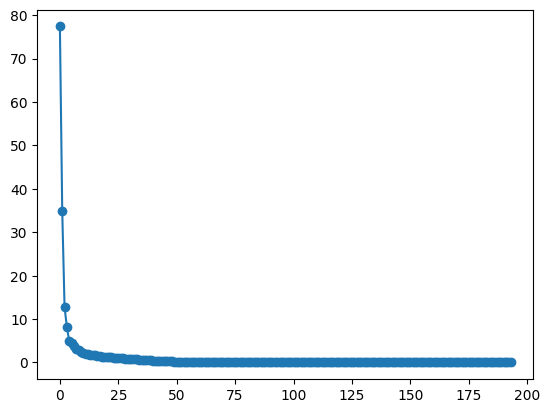

In [22]:
sc = StandardScaler()
X_train_scaled = sc.fit_transform(X_train)
X_test_scaled = sc.transform(X_test)
pca = PCA()
_ = pca.fit(X_train_scaled)
explain_variance = pca.explained_variance_ratio_
plt.plot(pca.explained_variance_, marker='o')

In [24]:
# we take the number of components corresponding to the elbow
pca_final = PCA(n_components=80)
X_train_pca = pca_final.fit_transform(X_train_scaled)

**XGBoost Optimisation**
***

From the training data, we now find CV'd optimal parameters using `Optuna`. Specifically, we will use a stepwise optimisation algorithm, that optimises predetermined groups of parameters at a time before other groups to save computation time.

We also use an evaluation metric from `eval_metrics.py`, which will be passed into `stepwise_optimisation`. Custom evaluation metrics can of course be added to `eval_metrics.py` and passed in. See the file for more.

In [ ]:
from optimise_xgb import stepwise_optimisation
import eval_metrics

eval_metric = eval_metrics.fbeta_eval
params = stepwise_optimisation(X_train, y_train, 3, eval_metric, data=os.path.splitext(data)[0], trials=400)

In [ ]:
print(params)
session.add_params(params)

{'num_boost_round': 597, 'learning_rate': 0.013086919287718076, 'objective': 'multi:softprob', 'num_class': 3, 'max_depth': 25, 'min_child_weight': 12.313836904495586, 'subsample': 0.9962939577859451, 'colsample_bytree': 0.9986547566144768, 'gamma': 0.05181350905584888}


**Run Backtests**
***

With our optimal parameters, it is time to pick a strategy and backtest it.

Strategies can be added to `strategies.py`. See the file for more info

In [ ]:
# define a model trainer - this will basically be the same for 
# all wf's, but make sure the eval_metric from above is used

# use gpu
params['tree_method'] = 'hist'
params['device'] = 'cuda'

def model_trainer(X_train, y_train):
    dtrain = xgb.DMatrix(X_train, label=y_train)

    model = xgb.train(
        params=params,
        dtrain=dtrain,
        num_boost_round=params['num_boost_round'],
        #obj='multi:softprob',
        custom_metric=eval_metric
    )

    return model

from backtest import Backtest

backtest = Backtest(
    model_trainer, X_train, y_train, X_test, y_test, train_timestamp, test_timestamp, num_classes,
    starting_capital=500_000, commission=0.0002
)

import strategies as strat
reload(strat)

strategy = strat.take_profit_3_class

# log strategy into session
session.add_strategy(strategy.__name__)

In [10]:
bt_results = backtest.run_backtest(strategy, retrain=True, train_frequency=24*7, progress_bar=True)

-------------------- Starting backtest --------------------

Progress: |██████████████████████████████████████████████████| 100.0% Complete


-------------------- Backtest Complete! --------------------


In [23]:
# log backtest results and then add it to /backtests/
session.add_backtest(bt_results)
session.log_session('backtests/')

bt_results.to_csv('backtest_test.csv')

NameError: name 'bt_results' is not defined

**Analysing Backtest results**
***

We use graphical approaches as well as financial metrics/analytics to assess the results of our test

In [12]:
from backtest_metrics import plot_backtest

plot_backtest(bt_results)

In [13]:
from backtest_metrics import print_backtest_metrics

print_backtest_metrics(bt_results)


================ Backtest  Metrics ================

---------------- Test  Information ----------------

Start:                          2024-02-08 15:00:00
End:                            2025-02-16 21:30:00
Duration:                       374 days, 6 hours, 30 mins, 0 seconds

---------------- Strategy Metrics -----------------

Strategy:                       take_profit_3_class

Exposure:                       0.18406990982967827
Initial Equity:                 500000.00 
Equity High:                    585155.70 
Equity Low:                     446442.50 
Final Equity:                   569139.51 

Return (ann.) [%]:              13.80     
Buy & Hold Return (ann.) [%]:   115.34    
Volatility (ann.) [%]:          19.98     
Sharpe Ratio (R=4.00%): 0.49      

----------------- Trade  Metrics ------------------

Num. Trades:                    24        
Win Rate [%]:                   55.75     
Avg. Trade [%]:                 2.17      
Avg. Trade Duration:            70.07471

In [22]:
model = model_trainer(
    pd.concat([X_train, X_test]), pd.concat([y_train, y_test])
)

KeyboardInterrupt: 

In [40]:
model.save_model('BTCUSDT_1m.json')

<Axes: >

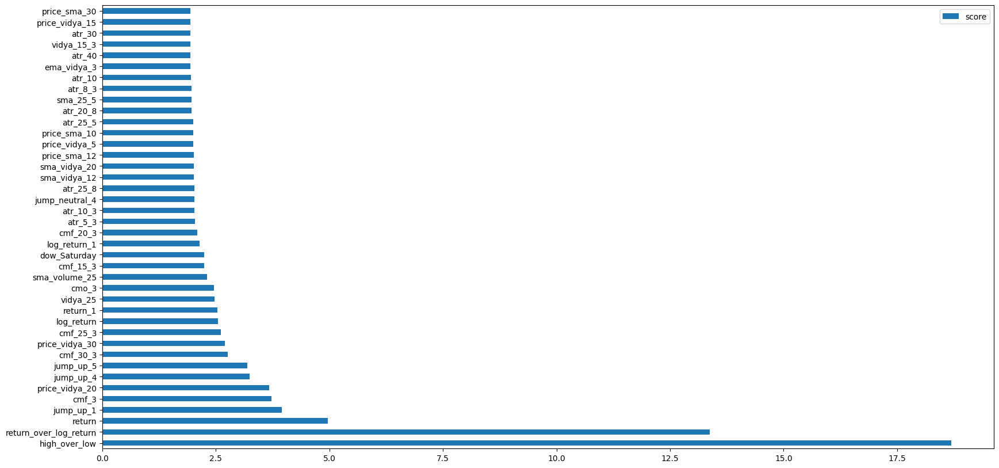

In [15]:
feature_important = model.get_score(importance_type='gain')
keys = list(feature_important.keys())
values = list(feature_important.values())

data = pd.DataFrame(data=values, index=keys, columns=["score"]).sort_values(by = "score", ascending=True)
data.nlargest(40, columns="score").plot(kind='barh', figsize = (20,10)) ## plot top 40 features